In [37]:
import numpy as np
import pandas as pd

import spice_net as spn

In [38]:
df = pd.read_csv('data/solar_pannel_data.csv')
df = df[(df['Luminosity (Lux)'] <= 500)]
max_lux = df['Luminosity (Lux)'].max()
df['cleaned_lux'] = df['Luminosity (Lux)'].apply(lambda x: x / max_lux)
max_volts = df['Voltage (Volts)'].max()
df['cleaned_voltage'] = df['Voltage (Volts)'].apply(lambda x: x / max_volts)
df

,DateTime,Luminosity (Lux),Voltage (Volts),Temprature (C),Dirty,cleaned_lux,cleaned_voltage
68,2023-05-01 21:34:18,175.0,0.29,22.25,True,0.350,0.015856
69,2023-05-01 21:41:28,125.0,0.24,22.00,True,0.250,0.013122
70,2023-05-01 21:48:38,77.0,0.15,22.00,True,0.154,0.008201
71,2023-05-01 21:55:33,48.0,0.10,21.75,True,0.096,0.005467
72,2023-05-01 22:02:43,27.0,0.05,21.50,True,0.054,0.002734
...,...,...,...,...,...,...,...
4073,2023-04-29 10:43:05,13.0,2.12,19.00,False,0.026,0.115910
4074,2023-04-29 10:50:00,10.0,2.00,19.00,False,0.020,0.109349
4075,2023-04-29 10:57:10,10.0,1.49,18.50,False,0.020,0.081465
4076,2023-04-29 11:04:20,11.0,1.71,18.25,False,0.022,0.093494


In [39]:
som_size = 100

som_1 = spn.SpiceNetSom(n_neurons=som_size,
                        value_range_start=df['cleaned_lux'].min(),
                        value_range_end=df['cleaned_lux'].max(),
                        lrf_tuning_curve=spn.ConstLRF(0.8),
                        lrf_interaction_kernel=spn.ConstLRF(0.8))
som_2 = spn.SpiceNetSom(n_neurons=som_size,
                        value_range_start=df['cleaned_voltage'].min(),
                        value_range_end=df['cleaned_voltage'].max(),
                        lrf_tuning_curve=spn.ConstLRF(0.8),
                        lrf_interaction_kernel=spn.ConstLRF(0.8))

correlation_matrix = spn.SpiceNetHcm(som_1=som_1,
                                     som_2=som_2,
                                     lrf_weights=spn.ConstLRF(0.5),  # spn.ExpEDecayLRF(0.003, 0.3, 0.6)
                                     lrf_trust_of_new=spn.ExpEDecayLRF(0.3, 0.25, 0.3))

spice_net = spn.SpiceNet(correlation_matrix)

In [40]:
config_1 = {'sample_set_size': 1000, 'epochs_on_batch': 100, 'batch_size': 40, 'train_set': 0.2}
config_2 = {'sample_set_size': 1300, 'epochs_on_batch': 50, 'batch_size': 100, 'train_set': 0.61}

config = config_2
sample_set_size = config['sample_set_size']
sub_set = df.sample(n=sample_set_size)
train_set = sub_set[:int(sample_set_size * config['train_set'])]
test_set = sub_set[int(sample_set_size * config['train_set']):]

In [41]:
spice_net.fit(train_set['cleaned_lux'].tolist(), train_set['cleaned_voltage'].tolist(),
              epochs_on_batch=config['epochs_on_batch'],
              batch_size=config['batch_size'],
              print_output=True)
spn.plot_som(som_1, True)
spn.plot_som(som_2, True)
spn.plot_hcm(correlation_matrix, False)
spn.plot_hcm(correlation_matrix, True)

100%|██████████| 8/8 [00:30<00:00,  3.85s/it]


Time spend on the Components: 
Som: 20.493136644363403 s | Convolution Matrix: 10.280966997146606 s


In [42]:
import plotly.express as px

test_set = df
test_set.sort_values(by=['DateTime'])

errors = []
errors_distance = []
predicted_values = []

for _, row in test_set.iterrows():
    inti_test_value = row['cleaned_lux']
    result_test_value = row['cleaned_voltage'] * max_volts
    predicted = spice_net.decode_som_1(inti_test_value) * max_volts
    predicted_values.append(predicted)
    errors.append(abs(predicted - result_test_value) / max_volts * 100)
    errors_distance.append(abs(predicted - result_test_value))
    print(
        f'Error: {errors[-1]:.6f},\t Distance: {errors_distance[-1]:.2f}, Predicted: {predicted:5.2f},\t Actual: {result_test_value:5.2f}')

print('------------------------------------')
print(f'test set length: {len(test_set)}')
print(f'Mean Error in V {np.mean(np.array(errors_distance))}')
print(f'Mean Error in % {np.mean(np.array(errors))}')
print(f'Median Error in % {np.median(np.array(errors))}')

direction = test_set['Voltage (Volts)'].to_numpy() - np.array(predicted_values)
error_df = pd.DataFrame(
    {'Index': range(1, len(errors) + 1),
     'Real': test_set['Voltage (Volts)'],
     'Distance': errors_distance,
     'dir': direction.tolist()})
fig = px.scatter(error_df, x="Index", y="Real", error_y="Distance")
fig.add_scatter(x=error_df['Index'].to_numpy(), y=predicted_values, fillcolor='orange', mode='markers', name='Predicted', zorder=1000)
#fig.add_scatter(x=error_df['Index'].to_numpy(), y=error_df['Real'].to_numpy(), fillcolor='green')
fig.show()

Error: 66.156886,	 Distance: 12.10, Predicted: 12.39,	 Actual:  0.29
Error: 53.838506,	 Distance: 9.85, Predicted: 10.09,	 Actual:  0.24
Error: 35.221292,	 Distance: 6.44, Predicted:  6.59,	 Actual:  0.15
Error: 70.768072,	 Distance: 12.94, Predicted: 13.04,	 Actual:  0.10
Error: 0.535090,	 Distance: 0.10, Predicted: -0.05,	 Actual:  0.05
Error: 0.303619,	 Distance: 0.06, Predicted: -0.04,	 Actual:  0.02
Error: 0.274982,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.297969,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.290836,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.290836,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.288030,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.262768,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.288030,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.288030,	 Distance: 0.05, Predicted: -0.05,	 Actual:  0.00
Error: 0.288030,	 Distance: 0.05, Predicted: -0.05,	 Act

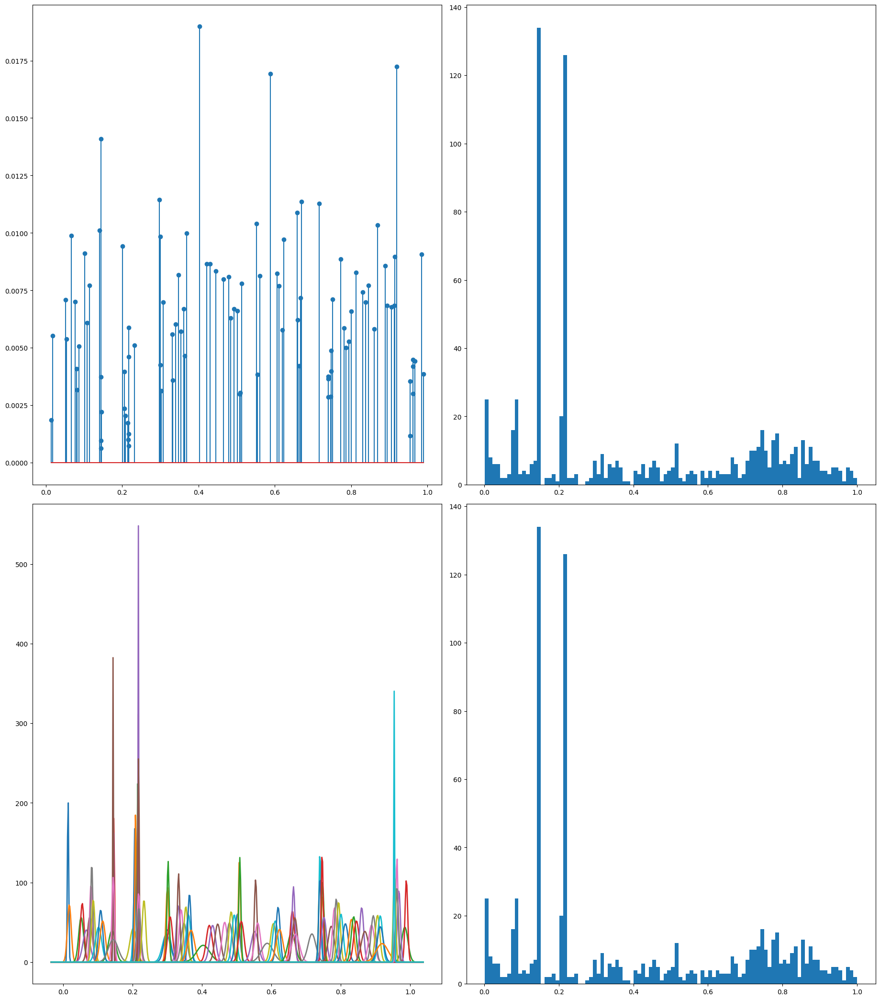

In [43]:
spn.plot_som_comparison_to_data(som_1, train_set['cleaned_lux'].tolist())